In [2]:
using DatasetManager, LabDataSources, C3D, DSP, PlotlyJS, Biomechanics, Statistics, Peaks, CSV, DataFrames, StatsBase, HypothesisTests, RollingFunctions, ColorSchemes

In [3]:
using PaperResearchCode

In [5]:
datapath = "../data"

subsets = [
    DataSubset("main", Source{C3DFile}, datapath, "PD [0-9]*/Patient [0-9]*/Session [0-2]/*.c3d")
    DataSubset("main", Source{C3DFile}, datapath, "Control [0-9]*/Patient [0-9]*/Session [0-2]/*.c3d")
]

labels = Dict(
    :group => ["PD", "Control"],
    :groupid => r"(?<=PD |Control )\d+",
    :subject => r"(?<=Patient )\d+",
    :session => r"(?<=Session )\d+",
    :task => r"(rrt|sip)",
    :cued => r"((un)?cued)"
)

conds = TrialConditions((:group,:groupid,:subject,:session,:task,:cued), labels; types=Dict(:groupid => Int, :subject => Int, :session => Int))

trials = findtrials(subsets, conds)

filter!(trials) do trial
    !hassubject(trial, 3) &&
    !hassubject(trial, 13)
end
demog = CSV.read("../data/demographics.csv", DataFrame)

recodecondition!.(trials, :cued => c -> c == "cued" ? true : false)
DatasetManager.addcondition!.(trials, :freezer => (t -> coalesce(only(demog[demog[!,"Subject Code"] .== t.subject, "FOGQ #3"]), 0) > 0))
DatasetManager.addcondition!.(trials, :bodyweight => (t -> only(demog[demog[!,"Subject Code"] .== t.subject, "Weight (kg)"])))

summarize(trials; verbosity=25, ignoreconditions=(:groupid,:freezer,:group,:bodyweight))

Subjects:
 └ 38: 1  2  4  5  6  7  8  9  10  11  12  …  33  34  35  36  37  38  39  40
Trials:
 ├ 280 trials
 └ Trials per subject:
   ├ 8: 32 subjects (84%)
   └ 4: 6 subjects (16%)
Conditions:
 ├ Observed levels:
 │ ├ task => ["rrt", "sip"]
 │ ├ cued => Bool[1, 0]
 │ └ session => [1, 2]
 └ Unique level combinations observed: 8 (full factorial)
     task │  cued │ session │ # trials 
    ──────┼───────┼─────────┼──────────
      rrt │  true │       1 │ 37       
      rrt │ false │       1 │ 37       
      sip │  true │       1 │ 37       
      sip │ false │       1 │ 37       
      rrt │  true │       2 │ 33       
      rrt │ false │       2 │ 33       
      sip │  true │       2 │ 33       
      sip │ false │       2 │ 33       
Sources:
 └ "main" => Source{C3DFile}, 280 trials (100%)


## RRT cycle development/debugging

In [6]:
rrt_trials = filter(hascondition(:task => "rrt"), trials);

In [7]:
t = rand(rrt_trials)
# t = last(filter(t -> subject(t) == 36 && hascondition(t, :task => "rrt", :cued => false), trials))

Trial{Int64}
  Subject: 19
  Name: rrt-cued
  Conditions:
    :freezer => false
    :group => "PD"
    :task => "rrt"
    :cued => true
    :session => 2
    :bodyweight => 84.3
    :groupid => 12
  Sources:
    "main" => Source{C3DFile}("../data/PD 12/Patient 19/Session 2/rrt-cued.c3d")


#### Development

In [ ]:
c = readsource(getsource(t, "main"); strip_prefixes=true)
bpm, cycles, side, fog_count = find_cycles(t)
plot([
        scatter(;y=c.point["RFIN"][:,2], name="RFIN")
        scatter(;y=c.point["LFIN"][:,2], name="LFIN")        
], Layout(;
        yaxis_fixedrange=true,
        shapes = [ vline(cycles[i]; line_width=2, line_color="slategrey", line_dash=(side[i] == 'R' ? "solid" : "dot")) for i in eachindex(cycles) ],
))

In [ ]:
c = readsource(getsource(t, "main"); strip_prefixes=true)
ridxs, lidxs, touches, p = let rmkr = c.point["RFIN"], lmkr = c.point["LFIN"]
    ridxs, = findmaxima(rmkr[:,2], 5; strict=false);
    _, rproms = peakproms!(ridxs, rmkr[:,2]; strict=false, minprom=50)
    lidxs, = findmaxima(lmkr[:,2], 5; strict=false);
    _, lproms = peakproms!(lidxs, lmkr[:,2]; strict=false, minprom=50)
    touchsig = centraldiff(c.analog["Electric Current.DTRG"]; dt=inv(1000))
    touches, touchvals = findmaxima(touchsig)
    _, tchproms = peakproms(touches, touchsig)
    _, tchproms = peakproms!(touches, touchsig; minprom=maximum(tchproms)/2)
    touchvals = touchsig[touches]

    p = plot([
            scatter(;y=rmkr[:,2], name="RFIN", yaxis="y2", hoverinfo="none")
            scatter(;x=ridxs, y=rmkr[ridxs,2], text=string.(round.(Int, rproms)), hoverinfo="x+y+text",
                name="R peaks", yaxis="y2", mode="markers", marker_symbol="circle-open", marker_size=8)
            scatter(;y=lmkr[:,2], name="LFIN", yaxis="y2", hoverinfo="none")
            scatter(;x=lidxs, y=lmkr[lidxs,2], text=string.(round.(Int, lproms)), hoverinfo="x+y+text",
                name="L peaks", yaxis="y2", mode="markers", marker_symbol="circle-open", marker_size=8)
            scatter(;x=totimes(touches, 10), y=touchvals, text=string.(round.(tchproms, digits=2)), hoverinfo="x+y+text",
                name="Touch peaks", yaxis="y1", mode="markers", marker_symbol="circle-open", marker_size=8)
            ], Layout(;
            yaxis1=attr(;
                domain=[0,0.4],
                fixedrange=true,
                showgrid=false,
            ),
            yaxis2=attr(;
                domain=[0.45,1],
                fixedrange=true,
            ),
            yaxis3=attr(;
                overlaying="y1",
                side="right",
                fixedrange=true,
                showgrid=false,
            ),
            ))
    ridxs, lidxs, touches, p
end
p

### Evaluation

In [5]:
# ENV["JULIA_DEBUG"] = "PaperResearchCode"
ENV["JULIA_DEBUG"] = "";

In [8]:
WITH_TOUCH = true;

In [9]:
i=25;

In [10]:
t

Trial{Int64}
  Subject: 19
  Name: rrt-cued
  Conditions:
    :freezer => false
    :group => "PD"
    :task => "rrt"
    :cued => true
    :session => 2
    :bodyweight => 84.3
    :groupid => 12
  Sources:
    "main" => Source{C3DFile}("../data/PD 12/Patient 19/Session 2/rrt-cued.c3d")


In [11]:
# t = rand(rrt_trials)
t = only(filter(t -> hassubject(t, 14) && hascondition(t, :cued => true, :session => 1), rrt_trials))

Trial{Int64}
  Subject: 14
  Name: rrt-cued
  Conditions:
    :freezer => false
    :group => "PD"
    :task => "rrt"
    :cued => true
    :session => 1
    :bodyweight => 59.8
    :groupid => 10
  Sources:
    "main" => Source{C3DFile}("../data/PD 10/Patient 14/Session 1/rrt-cued.c3d")


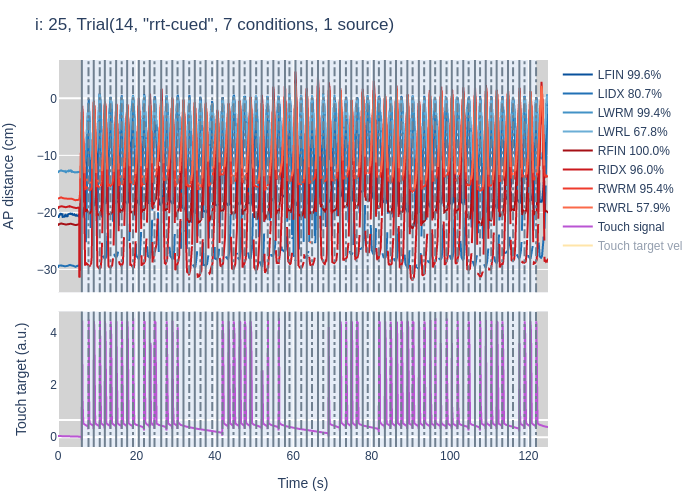

In [15]:
# t = rrt_trials[i+=1]
c = readsource(getsource(t, "main"); strip_prefixes=true)
left_steps, right_steps, fog = find_cycles(t)

# c = readsource(getsource(t, "cal_rrt_freq"); strip_prefixes=true)
# left_steps, right_steps, fog = find_cycles(t, getsource(t, "cal_rrt_freq"))

revents = sort!(unique!([ first.(left_steps); last.(left_steps); midpoint.(right_steps); ]))
levents = sort!(unique!([ first.(right_steps); last.(right_steps); midpoint.(left_steps); ]))

present_mkrs = find_present_markers(c, ["LFIN", "LIDX", "LWRM", "LWRL", "RFIN", "RIDX", "RWRM", "RWRL"]; threshold=0.25)

zeroed_mkrs = Dict()
foreach(present_mkrs) do mkr
    get!(zeroed_mkrs, mkr) do
        if startswith(mkr, "R")
            @views (c.point[mkr][:,2] .- mean(skipmissing(c.point[mkr][revents,2]))) ./ 10
        else
            @views (c.point[mkr][:,2] .- mean(skipmissing(c.point[mkr][levents,2]))) ./ 10
        end
        # @views c.point[mkr][:,2] 
    end
end

revents = totimes(revents, 100)
levents = totimes(levents, 100)

mkr_color = Dict(( name => ColorSchemes.Blues_9.colors[i+4] for (i,name) in enumerate(reverse(["LFIN", "LIDX", "LWRM", "LWRL"])))...,
    ( name => ColorSchemes.Reds_9.colors[i+4] for (i,name) in enumerate(reverse(["RFIN", "RIDX", "RWRM", "RWRL"])))...)

traces = [[ 
    scatter(;x=totimes(axes(zeroed_mkrs[mkr], 1), 100), y=zeroed_mkrs[mkr], name=string(mkr, ' ', round(count(!ismissing, @view(c.point[mkr][:,2]))/size(c.point[mkr], 1)*100; digits=1), '%'),
        line_color=mkr_color[mkr], yaxis="y2")
        for mkr in present_mkrs
    ];
    # [
    #     scatter(;x=[0,0.01], y=[0,0], name=string(mkr, ' ', round(count(!ismissing, @view(c.point[mkr][:,2]))/size(c.point[mkr], 1)*100; digits=1), '%'),
    #         line_color="darkgrey", yaxis="y2", mode="line", visible="legendonly")
    #     for mkr in setdiff(["LFIN", "LIDX", "LWRM", "LWRL", "RFIN", "RIDX", "RWRM", "RWRL"], present_mkrs)
    # ];
    # scatter(;x=pks, y=fill(0, length(pks)), yaxis="y2", mode="markers", marker_symbol="x", marker_color="black", marker_size=8, showlegend=false);
    # scatter(;x=unclust./10, y=fill(0, length(unclust)), yaxis="y2", mode="markers", marker_symbol="x", marker_color="DimGray", marker_size=8, showlegend=false)
    ]

FOGs = totimes.(invert_array_of_ranges(contiguousranges(sort!([left_steps; right_steps]))), 100)

p = plot(traces, Layout(;
        height=500,
        width=1250,
        title=string("i: $i, ", sprint(show, t)),
        xaxis_title="Time (s)",
        yaxis1=attr(;
            domain=[0,1],
            fixedrange=true,
            visible=false,
            showgrid=false,
            showline=false,
            showticklabels=false,
        ),
        yaxis2=attr(;
            domain=[0,1],
            fixedrange=true,
            title="AP distance (cm)",
        ),
        yaxis3=attr(;
            domain=[0,0.4],
            overlaying="y1",
            # side="right",
            fixedrange=true,
            showgrid=false,
            title="Touch target (a.u.)",
        ),
        shapes = [
            vline.(revents; yref="y2 domain", line_width=2, line_color="slategrey", line_dash="solid");
            vline.(levents; yref="y2 domain", line_width=2, line_color="slategrey", line_dash="dashdot");
            [ PlotlyJS.rect(first(rg), last(rg), 0, 1; yref="y2 domain", fillcolor="LightSalmon", opacity=0.5, layer="below", line_width=0) for rg in FOGs ];
            PlotlyJS.rect(0, min(first(levents), first(revents)), 0, 1; yref="y2 domain", fillcolor="LightGray", layer="below", line_width=0);
            PlotlyJS.rect(max(last(levents), last(revents)), totimes(size(c.point[present_mkrs[1]], 1), 100), 0, 1; yref="y2 domain", fillcolor="LightGray", layer="below", line_width=0);
        ],
))

if WITH_TOUCH
    touchtarg = condition_touch(c.analog["Electric Current.DTRG"])
    touchtarg_vel = centraldiff(touchtarg; dt=inv(1000))

    addtraces!.(Ref(p), [
        scatter(;x=totimes(axes(touchtarg,1), 1000), y=touchtarg, hoverinfo="none", yaxis="y3", name="Touch signal", line_color="MediumOrchid")
        scatter(;x=totimes(axes(touchtarg,1), 1000), y=touchtarg_vel, hoverinfo="none", yaxis="y1", name="Touch target vel", visible="legendonly")
        ])
    
    add_vline!.(Ref(p), revents; yref="y1 domain", line_width=2, line_color="slategrey", line_dash="solid")
    add_vline!.(Ref(p), levents; yref="y1 domain", line_width=2, line_color="slategrey", line_dash="dashdot")
    
    foreach(FOGs) do rg
        add_vrect!(p, first(rg), last(rg); yref="y1 domain", fillcolor="LightSalmon", opacity=0.5, layer="below", line_width=0)
    end
    add_vrect!(p, 0, min(first(levents), first(revents)); yref="y1 domain", fillcolor="LightGray", layer="below", line_width=0)
    add_vrect!(p, max(last(levents), last(revents)), totimes(size(c.point[present_mkrs[1]], 1), 100); yref="y1 domain", fillcolor="LightGray", layer="below", line_width=0)
    
    relayout!(p; yaxis1_domain=[0, 0.35], yaxis2_domain=[0.4, 1], yaxis1_visible=true, showgrid=true, showline=true, showticklabels=true,)
end
p

## SIP cycle development/debugging

In [16]:
siptrials = filter(hascondition(:task => "sip"), trials);

In [17]:
# t = rand(siptrials)
t = filter(t -> hassubject(t, 36) && hascondition(t, :task => "sip", :cued => false), trials)[1]

Trial{Int64}
  Subject: 36
  Name: sip-uncued
  Conditions:
    :freezer => true
    :group => "PD"
    :task => "sip"
    :cued => false
    :session => 1
    :bodyweight => 69.2
    :groupid => 26
  Sources:
    "main" => Source{C3DFile}("../data/PD 26/Patient 36/Session 1/sip-uncued.c3d")


### Development

#### Find trials with (potential) FOG

In [210]:
srs = analyzedataset(filter(hascondition(:task => "sip"), trials), Source{Nothing}) do trial
    seg = Segment(trial, Source{Nothing}())
    sr = SegmentResult(seg)
    res = results(sr)
    left_steps, right_steps, fog = find_cycles(trial, getsource(trial, "main"))

    res["notperfect"] = fog

    sr
end;

Analyzing trials... 100%|███████████████████████████████| Time: 0:00:13


In [204]:
bad = findall(sr -> get(results(sr), "notperfect", true), srs)
badsiptrials = siptrials[bad]
@warn "$(length(bad)) SIP trials failing cycle detection or with FOG"

┌ Warning: 29 SIP trials failing cycle detection or with FOG
└ @ Main In[204]:3


In [ ]:
t = rand(badsiptrials)
# t = badsiptrials[i+=1]
# t

#### Lower limb marker presence/quality characterization

In [101]:
srs = analyzedataset(filter(hascondition(:task => "sip"), trials), Source{C3DFile}) do trial
    seg = Segment(trial, "main")
    sr = SegmentResult(seg)
    res = results(sr)
    c = readsegment(seg; strip_prefixes=true)
    for mkr in ["LANK", "LHEE", "LMT5", "LTOE", "RANK", "RHEE", "RMT5", "RTOE"]
        if haskey(c.point, mkr)
            res[mkr] = count(!ismissing, @view(c.point[mkr][:,3]))/size(c.point[mkr], 1)
        else
            res[mkr] = 0.
        end
    end
    sr
end;

┌ Warning: A method of `readsegment` has not been defined for `Source{C3DFile}`;this means that `seg.start` and `seg.finish` will be ignored
└ @ DatasetManager /home/allen/.julia/dev/DatasetManager/src/segment.jl:134


Analyzing trials... 100%|███████████████████████████████| Time: 0:00:12


140-element Vector{SegmentResult{Source{C3DFile}, Int64}}:
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(4, "SIP_STAND_BOTH_C", 7 conditions, 3 sources), Source{C3DFile}(…), begin:end), 8 results)
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(4, "SIP_STAND_BOTH_NC", 7 conditions, 3 sources), Source{C3DFile}(…), begin:end), 8 results)
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(4, "SIP_STAND_BOTH_C", 7 conditions, 3 sources), Source{C3DFile}(…), begin:end), 8 results)
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(4, "SIP_STAND_BOTH_NC", 7 conditions, 3 sources), Source{C3DFile}(…), begin:end), 8 results)
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(5, "SIP_STAND_BOTH_C", 7 conditions, 3 sources), Source{C3DFile}(…), begin:end), 8 results)
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(5, "sip-stand-both-nc", 7 conditions, 3 sources), Source{C3DFile}(…), begin:end), 8 results)
 SegmentResult(Segment{Source{C3DFile},Int64}(Trial(5, "sip-stand-both-c",

In [103]:
mkrpresence = DatasetManager.stack(srs)
mkrpresencewide = unstack(mkrpresence);

In [44]:
describe(mkrpresence)

,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,subject,,1,,40,0,"CategoricalValue{Int64, UInt32}"
2,freezer,,false,,true,0,"CategoricalValue{Bool, UInt32}"
3,group,,Control,,PD,0,"CategoricalValue{String, UInt32}"
4,task,,sip,,sip,0,"CategoricalValue{String, UInt32}"
5,cued,,false,,true,0,"CategoricalValue{Bool, UInt32}"
6,session,,1,,2,0,"CategoricalValue{Int64, UInt32}"
7,bodyweight,,53.0,,117.2,4,"Union{Missing, CategoricalValue{Float64, UInt32}}"
8,groupid,,1,,28,0,"CategoricalValue{Int64, UInt32}"
9,LANK,0.891712,0.0,0.99124,1.0,0,"Union{Missing, Float64}"


In [ ]:
plot([
        histogram(;x=mkrpresence[!, mkr], name=mkr)
        for mkr in ["LANK", "LHEE", "LMT5", "LTOE", "RANK", "RHEE", "RMT5", "RTOE"]
    ])

In [105]:
gd = groupby(mkrpresence, :variable)
combine(gd, :value => (x -> count(<(0.6), x)) => :count)

,variable,count
,String,Int64
1,LANK,15
2,LHEE,19
3,LMT5,12
4,LTOE,7
5,RANK,0
6,RHEE,14
7,RMT5,14
8,RTOE,5


### Evaluation

In [18]:
WITH_FORCE = true;
# WITH_FORCE = false;

In [19]:
i = 0;

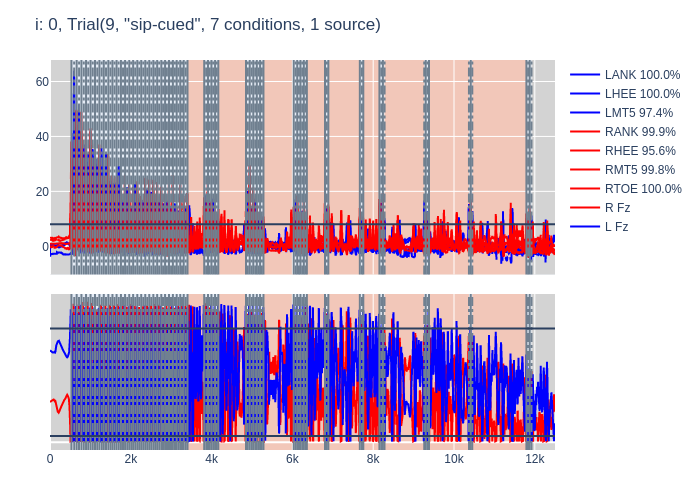

In [21]:
# t = siptrials[i+=1]
t = only(filter(t -> hassubject(t, 9) && hascondition(t, :task => "sip", :cued => true, :session => 2), trials))
c = readsource(getsource(t, "main"); strip_prefixes=true)
left_steps, right_steps, = find_cycles(t, getsource(t, "main"); filter5=false)

# c = readsource(getsource(t, "cal_sip_freq"); strip_prefixes=true)
# left_steps, right_steps, = find_cycles(t, getsource(t, "cal_sip_freq"); filter5=false)

present_mkrs = find_present_markers(c, ["LANK", "LHEE", "LMT5", "LTOE", "RANK", "RHEE", "RMT5", "RTOE"])
shifted_mkrs = zero_markers(c, present_mkrs)


revents = sort!(unique!([ first.(left_steps); last.(left_steps); midpoint.(right_steps); ]))
levents = sort!(unique!([ first.(right_steps); last.(right_steps); midpoint.(left_steps); ]))

traces = [ 
    scatter(;y=shifted_mkrs[mkr], name=string(mkr, ' ', round(count(!ismissing, @view(c.point[mkr][:,3]))/size(c.point[mkr], 1)*100; digits=1), '%'),
        line_color=(startswith(mkr, "R") ? "red" : "blue"), yaxis="y2")
        for mkr in present_mkrs
    ]

FOGs = invert_array_of_ranges(contiguousranges(sort!([left_steps; right_steps])))

p = plot(traces, Layout(;
        height=500,
        width=1250,
        title=string("i: $i, ", sprint(show, t)),
        yaxis1=attr(;
            domain=[0,1],
            fixedrange=true,
            visible=false,
            showgrid=false,
            showline=false,
            showticklabels=false,
        ),
        yaxis2=attr(;
            domain=[0,1],
            fixedrange=true,
        ),
        yaxis3=attr(;
            domain=[0,0.4],
            overlaying="y1",
            side="right",
            fixedrange=true,
            showgrid=false,
        ),
        shapes = [
            vline.(revents; yref="y2 domain", line_width=2, line_color="slategrey", line_dash="solid");
            vline.(levents; yref="y2 domain", line_width=2, line_color="slategrey", line_dash="dashdot");
            hline(8; yref="y2");
            [ PlotlyJS.rect(first(rg), last(rg), 0, 1; yref="y2 domain", fillcolor="LightSalmon", opacity=0.5, layer="below", line_width=0) for rg in FOGs ];
            PlotlyJS.rect(0, min(first(levents), first(revents)), 0, 1; yref="y2 domain", fillcolor="LightGray", layer="below", line_width=0);
            PlotlyJS.rect(max(last(levents), last(revents)), size(shifted_mkrs[present_mkrs[1]], 1), 0, 1; yref="y2 domain", fillcolor="LightGray", layer="below", line_width=0);
        ],
))

if WITH_FORCE
    Rfz = condition_FP(-c.analog["Force.Fz1"])
    Rfz .-= minimum(Rfz)
    Lfz = condition_FP(-c.analog["Force.Fz2"])
    Lfz .-= minimum(Lfz)
    
    addtraces!.(Ref(p), [
        scatter(;x=totimes(axes(Rfz,1), 10), y=Rfz, yaxis="y1", name="R Fz", line_color="red")
        scatter(;x=totimes(axes(Lfz,1), 10), y=Lfz, yaxis="y1", name="L Fz", line_color="blue")
        ])
    
    add_vline!.(Ref(p), revents; yref="y1 domain", line_width=2, line_color="slategrey", line_dash="solid")
    add_vline!.(Ref(p), levents; yref="y1 domain", line_width=2, line_color="slategrey", line_dash="dashdot")
    add_hline!(p, coalesce(conditions(t)[:bodyweight], 0)*9.81*.9; yref="y1")
    add_hline!(p, minimum(Rfz)+coalesce(conditions(t)[:bodyweight], 0)*9.81*.05; yref="y1")
    
    foreach(FOGs) do rg
        add_vrect!(p, first(rg), last(rg); yref="y1 domain", fillcolor="LightSalmon", opacity=0.5, layer="below", line_width=0)
    end
    add_vrect!(p, 0, min(first(levents), first(revents)); yref="y1 domain", fillcolor="LightGray", layer="below", line_width=0)
    add_vrect!(p, max(last(levents), last(revents)), size(shifted_mkrs[present_mkrs[1]], 1); yref="y1 domain", fillcolor="LightGray", layer="below", line_width=0)
    
    relayout!(p; yaxis1_domain=[0, 0.4], yaxis2_domain=[0.45, 1], yaxis1_visible=true, showgrid=true, showline=true, showticklabels=true,)
end
p

## Analysis

In [ ]:
t = rand(trials)

In [66]:
function broadstrokes(trial)
    seg = Segment(trial, Source{Nothing}(""))
    sr = SegmentResult(seg)
    res = results(sr)
    
    bpm, _, _, fog_count = find_cycles(trial)
    
    target_bpm, _ = find_cycles(trial, getsource(trial, "cal_rrt_freq"), Val(:rrt))
    res["target_bpm"] = target_bpm
    res["bpm"] = bpm
    # res["bpm_cov"] = variation(length.(cycles))*100
    res["pres_fog"] = fog_count
    res["bpm_err"] = (bpm - target_bpm)/target_bpm
    
    return sr
end

broadstrokes (generic function with 1 method)

In [174]:
srs = analyzedataset(broadstrokes, filter(hascondition(:task => "rrt"), trials), Source{Nothing})
rrtlong = DatasetManager.stack(srs);

Analyzing trials...  39%|████████████▏                  |  ETA: 0:01:03

┌ Error: Trial(24, "rrt-stand-both-c", 6 conditions, 3 sources)
│   err = KeyError("LFIN")
│ Stacktrace:
│   [1] getindex
│     @ ./dict.jl:498 [inlined]
│   [2] find_cycles(trial::Trial{Int64}, src::Source{C3DFile}, #unused#::Val{:rrt})
│     @ PaperResearchCode ~/Dropbox/documents/School/UOttawa/projects/hirams-study/src/mvc.jl:116
│   [3] find_cycles(trial::Trial{Int64})
│     @ PaperResearchCode ~/Dropbox/documents/School/UOttawa/projects/hirams-study/src/mvc.jl:52
│   [4] broadstrokes(trial::Trial{Int64})
│     @ Main ./In[66]:6
│   [5] analyzedataset(fun::typeof(broadstrokes), trials::Vector{Trial{Int64}}, ::Type{Source{Nothing}}; threaded::Bool, enable_progress::Bool, show_errors::Bool)
│     @ DatasetManager ~/.julia/dev/DatasetManager/src/trial.jl:820
│   [6] analyzedataset(fun::Function, trials::Vector{Trial{Int64}}, ::Type{Source{Nothing}})
│     @ DatasetManager ~/.julia/dev/DatasetManager/src/trial.jl:785
│   [7] top-level scope
│     @ In[174]:1
│   [8] eval
│     @ ./boo

Analyzing trials... 100%|███████████████████████████████| Time: 0:01:25


In [68]:
rrtwide = unstack(rrtlong)

,subject,freezer,group,task,cued,session,groupid,bpm,bpm_err
,Cat…,Cat…,Cat…,Cat…,Cat…,Cat…,Cat…,Float64?,Float64?
1,1,false,Control,rrt,false,1,1,missing,missing
2,1,false,Control,rrt,false,2,1,47.619,-0.00238095
3,1,false,Control,rrt,true,1,1,48.1541,-0.00802568
4,1,false,Control,rrt,true,2,1,45.3686,-0.0495274
5,2,false,Control,rrt,false,1,2,133.038,0.186253
6,2,false,Control,rrt,false,2,2,108.401,0.0749774
7,2,false,Control,rrt,true,1,2,107.72,-0.0394973
8,2,false,Control,rrt,true,2,2,107.914,0.0701439
9,4,false,PD,rrt,false,1,2,35.2734,-0.0452675


In [69]:
count(ismissing, rrtwide[!,:bpm])

11

In [9]:
plot(scatter(;y=c.analog["Electric Current.DTRG"]))

LoadError: UndefVarError: c not defined

# Marker gap characterization

In [198]:
traces = [
    heatmap(;x=1:100, y=ones(100), yaxis="y4", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RHEE"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y3", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RTOE"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y2", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RMT5"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y1", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RANK"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y4", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LHEE"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y3", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LTOE"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y2", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LMT5"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y1", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LANK"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
];

LoadError: UndefVarError: idxs not defined

In [79]:
traces = [
    heatmap(;x=1:100, y=ones(100), yaxis="y4", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RIDX"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y3", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RFIN"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y2", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RWRM"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y1", xaxis="x1", z=cycle_missing_histogram(idxs, c.point["RWRL"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y4", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LIDX"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y3", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LFIN"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y2", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LWRM"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
    heatmap(;x=1:100, y=ones(100), yaxis="y1", xaxis="x2", z=cycle_missing_histogram(idxs, c.point["LWRL"][:,2]), zsmooth="fast", hoverinfo="x+z", coloraxis="coloraxis")
];

LoadError: UndefVarError: idxs not defined

In [25]:
hspace = .01
layout = Layout(;
    xaxis1=attr(;
        domain=[0.505, 1],
        ticksuffix="%",
    ),
    xaxis2=attr(;
        domain=[0, 0.495],
        ticksuffix="%",
    ),
    yaxis1=attr(;
        domain=[0,0.25 - hspace],
        showticklabels=false,
    ),
    yaxis2=attr(;
        domain=[0.25+hspace, 0.5 - hspace],
        showticklabels=false,
    ),
    yaxis3=attr(;
        domain=[0.5+hspace, 0.75 - hspace],
        showticklabels=false,
    ),
    yaxis4=attr(;
        domain=[0.75+hspace, 1.],
        showticklabels=false,
    ),
    coloraxis=attr(;
        cmax=1,
        cmin=0,
    ),
    annotations=[
        attr(;
            showarrow=false,
            yref="y4", y=1,
            xref="x1 domain", xanchor="left", x=1,
            text="RIDX"
        ),
        attr(;
            showarrow=false,
            yref="y3", y=1,
            xref="x1 domain", xanchor="left", x=1,
            text="RFIN"
        ),
        attr(;
            showarrow=false,
            yref="y2", y=1,
            xref="x1 domain", xanchor="left", x=1,
            text="RWRM"
        ),
        attr(;
            showarrow=false,
            yref="y1", y=1,
            xref="x1 domain", xanchor="left", x=1,
            text="RWRL"
        ),
        attr(;
            showarrow=false,
            yref="y4", y=1,
            xref="x2 domain", xanchor="right", x=0,
            text="LIDX"
        ),
        attr(;
            showarrow=false,
            yref="y3", y=1,
            xref="x2 domain", xanchor="right", x=0,
            text="LFIN"
        ),
        attr(;
            showarrow=false,
            yref="y2", y=1,
            xref="x2 domain", xanchor="right", x=0,
            text="LWRM"
        ),
        attr(;
            showarrow=false,
            yref="y1", y=1,
            xref="x2 domain", xanchor="right", x=0,
            text="LWRL"
        ),
    ],
);